<a href="https://colab.research.google.com/github/OmarAlsaqa/Upside_down_detector/blob/main/Upside_down_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Upside down detector**:
Train a model to detect if images are upside down

* Synthetically turn some of images upside down. Create a training and test set.
* Build a neural network (using Tensorflow)
* Train it to classify image orientation until a reasonable accuracy is reached
* Look at some of the images that were classified incorrectly.


In [ ]:
!nvidia-smi

Sat Apr  2 10:25:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
'''
The Following code is taken from: https://github.com/d4nst/RotNet, with minor changes.
'''

'\nThe Following code is taken from: https://github.com/d4nst/RotNet, with minor changes.\n'

In [ ]:
# Imports

from __future__ import division
from __future__ import print_function

import os
import sys
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import Iterator
from tensorflow.keras.utils import to_categorical
import tensorflow.keras.backend as K

In [ ]:
# Important Functions

def angle_difference(x, y):
  """
  Calculate minimum difference between two angles.
  """
  return 180 - abs(abs(x - y) - 180)

def angle_error(y_true, y_pred):
  """
  Calculate the mean diference between the true angles
  and the predicted angles. Each angle is represented
  as a binary vector.
  """
  diff = angle_difference(K.argmax(y_true), K.argmax(y_pred))
  return K.mean(K.cast(K.abs(diff), K.floatx()))


def rotate(image, angle):
  """
  Rotates an OpenCV 2 / NumPy image about it's centre by the given angle
  (in degrees). The returned image will be large enough to hold the entire
  new image, with a black background
  Source: http://stackoverflow.com/questions/16702966/rotate-image-and-crop-out-black-borders
  """
  # Get the image size
  # No that's not an error - NumPy stores image matricies backwards
  image_size = (image.shape[1], image.shape[0])
  image_center = tuple(np.array(image_size) / 2)

  # Convert the OpenCV 3x2 rotation matrix to 3x3
  rot_mat = np.vstack(
    [cv2.getRotationMatrix2D(image_center, angle, 1.0), [0, 0, 1]]
  )

  rot_mat_notranslate = np.matrix(rot_mat[0:2, 0:2])

  # Shorthand for below calcs
  image_w2 = image_size[0] * 0.5
  image_h2 = image_size[1] * 0.5

  # Obtain the rotated coordinates of the image corners
  rotated_coords = [
    (np.array([-image_w2,  image_h2]) * rot_mat_notranslate).A[0],
    (np.array([ image_w2,  image_h2]) * rot_mat_notranslate).A[0],
    (np.array([-image_w2, -image_h2]) * rot_mat_notranslate).A[0],
    (np.array([ image_w2, -image_h2]) * rot_mat_notranslate).A[0]
  ]

  # Find the size of the new image
  x_coords = [pt[0] for pt in rotated_coords]
  x_pos = [x for x in x_coords if x > 0]
  x_neg = [x for x in x_coords if x < 0]

  y_coords = [pt[1] for pt in rotated_coords]
  y_pos = [y for y in y_coords if y > 0]
  y_neg = [y for y in y_coords if y < 0]

  right_bound = max(x_pos)
  left_bound = min(x_neg)
  top_bound = max(y_pos)
  bot_bound = min(y_neg)

  new_w = int(abs(right_bound - left_bound))
  new_h = int(abs(top_bound - bot_bound))

  # We require a translation matrix to keep the image centred
  trans_mat = np.matrix([
    [1, 0, int(new_w * 0.5 - image_w2)],
    [0, 1, int(new_h * 0.5 - image_h2)],
    [0, 0, 1]
  ])

  # Compute the tranform for the combined rotation and translation
  affine_mat = (np.matrix(trans_mat) * np.matrix(rot_mat))[0:2, :]

  # Apply the transform
  result = cv2.warpAffine(
    image,
    affine_mat,
    (new_w, new_h),
    flags=cv2.INTER_LINEAR
  )

  return result


def largest_rotated_rect(w, h, angle):
  """
  Given a rectangle of size wxh that has been rotated by 'angle' (in
  radians), computes the width and height of the largest possible
  axis-aligned rectangle within the rotated rectangle.
  Original JS code by 'Andri' and Magnus Hoff from Stack Overflow
  Converted to Python by Aaron Snoswell
  Source: http://stackoverflow.com/questions/16702966/rotate-image-and-crop-out-black-borders
  """

  quadrant = int(math.floor(angle / (math.pi / 2))) & 3
  sign_alpha = angle if ((quadrant & 1) == 0) else math.pi - angle
  alpha = (sign_alpha % math.pi + math.pi) % math.pi

  bb_w = w * math.cos(alpha) + h * math.sin(alpha)
  bb_h = w * math.sin(alpha) + h * math.cos(alpha)

  gamma = math.atan2(bb_w, bb_w) if (w < h) else math.atan2(bb_w, bb_w)

  delta = math.pi - alpha - gamma

  length = h if (w < h) else w

  d = length * math.cos(alpha)
  a = d * math.sin(alpha) / math.sin(delta)

  y = a * math.cos(gamma)
  x = y * math.tan(gamma)

  return (
    bb_w - 2 * x,
    bb_h - 2 * y
  )


def crop_around_center(image, width, height):
  """
  Given a NumPy / OpenCV 2 image, crops it to the given width and height,
  around it's centre point
  Source: http://stackoverflow.com/questions/16702966/rotate-image-and-crop-out-black-borders
  """

  image_size = (image.shape[1], image.shape[0])
  image_center = (int(image_size[0] * 0.5), int(image_size[1] * 0.5))

  if(width > image_size[0]):
    width = image_size[0]

  if(height > image_size[1]):
    height = image_size[1]

  x1 = int(image_center[0] - width * 0.5)
  x2 = int(image_center[0] + width * 0.5)
  y1 = int(image_center[1] - height * 0.5)
  y2 = int(image_center[1] + height * 0.5)

  return image[y1:y2, x1:x2]


def crop_largest_rectangle(image, angle, height, width):
  """
  Crop around the center the largest possible rectangle
  found with largest_rotated_rect.
  """
  return crop_around_center(
    image,
    *largest_rotated_rect(
      width,
      height,
      math.radians(angle)
    )
  )


def generate_rotated_image(image, angle, size=None, crop_center=False, crop_largest_rect=False):
  """
  Generate a valid rotated image for the RotNetDataGenerator. If the
  image is rectangular, the crop_center option should be used to make
  it square. To crop out the black borders after rotation, use the
  crop_largest_rect option. To resize the final image, use the size
  option.
  """
  height, width = image.shape[:2]
  if crop_center:
    if width < height:
      height = width
    else:
      width = height

  image = rotate(image, angle)

  if crop_largest_rect:
    image = crop_largest_rectangle(image, angle, height, width)

  if size:
    image = cv2.resize(image, size)

  return image

In [ ]:
def display_examples(model, input, num_images=5, size=None, crop_center=False,
                     crop_largest_rect=False, preprocess_func=None, save_path=None):
  """
  Given a model that predicts the rotation angle of an image,
  and a NumPy array of images or a list of image paths, display
  the specified number of example images in three columns:
  Original, Rotated and Corrected.
  """

  if isinstance(input, (np.ndarray)):
    images = input
    N, h, w = images.shape[:3]
    if not size:
        size = (h, w)
    indexes = np.random.choice(N, num_images)
    images = images[indexes, ...]
  else:
    images = []
    filenames = input
    N = len(filenames)
    indexes = np.random.choice(N, num_images)
    for i in indexes:
        image = cv2.imread(filenames[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        images.append(image)
    images = np.asarray(images)

  x = []
  y = []
  for image in images:
    rotation_angle = np.random.randint(360)
    rotated_image = generate_rotated_image(
      image,
      rotation_angle,
      size=size,
      crop_center=crop_center,
      crop_largest_rect=crop_largest_rect
    )
    x.append(rotated_image)
    y.append(rotation_angle)

  x = np.asarray(x, dtype='float32')
  y = np.asarray(y, dtype='float32')

  if x.ndim == 3:
    x = np.expand_dims(x, axis=3)

  y = to_categorical(y, 360)

  x_rot = np.copy(x)

  if preprocess_func:
    x = preprocess_func(x)

  y = np.argmax(y, axis=1)
  y_pred = np.argmax(model.predict(x), axis=1)

  plt.figure(figsize=(10.0, 2 * num_images))

  title_fontdict = {
    'fontsize': 14,
    'fontweight': 'bold'
  }

  fig_number = 0
  for rotated_image, true_angle, predicted_angle in zip(x_rot, y, y_pred):
    original_image = rotate(rotated_image, -true_angle)
    if crop_largest_rect:
      original_image = crop_largest_rectangle(original_image, -true_angle, *size)

    corrected_image = rotate(rotated_image, -predicted_angle)
    if crop_largest_rect:
      corrected_image = crop_largest_rectangle(corrected_image, -predicted_angle, *size)

    if x.shape[3] == 1:
      options = {'cmap': 'gray'}
    else:
      options = {}

    fig_number += 1
    ax = plt.subplot(num_images, 3, fig_number)
    if fig_number == 1:
      plt.title('Original\n', fontdict=title_fontdict)
    plt.imshow(np.squeeze(original_image).astype('uint8'), **options)
    plt.axis('off')

    fig_number += 1
    ax = plt.subplot(num_images, 3, fig_number)
    if fig_number == 2:
      plt.title('Rotated\n', fontdict=title_fontdict)
    ax.text(
      0.5, 1.03, 'Angle: {0}'.format(true_angle),
      horizontalalignment='center',
      transform=ax.transAxes,
      fontsize=11
    )
    plt.imshow(np.squeeze(rotated_image).astype('uint8'), **options)
    plt.axis('off')

    fig_number += 1
    ax = plt.subplot(num_images, 3, fig_number)
    corrected_angle = angle_difference(predicted_angle, true_angle)
    if fig_number == 3:
      plt.title('Corrected\n', fontdict=title_fontdict)
    ax.text(
      0.5, 1.03, 'Angle: {0}'.format(corrected_angle),
      horizontalalignment='center',
      transform=ax.transAxes,
      fontsize=11
    )
    plt.imshow(np.squeeze(corrected_image).astype('uint8'), **options)
    plt.axis('off')

  plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

  if save_path:
    plt.savefig(save_path)

In [ ]:
def download(output_dir):
  '''
  To download and extract the Google Street View data.
  Inputs:
    output_dir (str): The path were you want to download the dataset.
  '''
  # download only two parts of the dataset change 1 to max 10.
  for i in range(1):
    filename = 'part{}.zip'.format(i + 1)
    url = r'http://www.cs.ucf.edu/~aroshan/index_files/Dataset_PitOrlManh/zipped\ images/' + filename
    print('Downloading', str(url))
    !wget -NP {output_dir} {url}

    print('\nExtracting', filename)
    !unzip -nq {str(output_dir + '/' + filename)} -d {output_dir}
    # !rm *.zip


def get_filenames(path):
  '''
  To get a list of the names of the images of Google Street View dataset
  Inputs:
    - path (str): The path were the images are downloaded.
  Returns:
    - train_filenames, test_filenames (tuple): 2 lists in a tuple for the train and test sets.
  '''
  if not os.path.exists(path):
    os.makedirs(path)
    download(path)
  elif len(os.listdir(path)) == 0:
    download(path)

  image_paths = []
  for filename in os.listdir(path):
    if filename.endswith(".zip"):
      continue
    view_id = filename.split('_')[1].split('.')[0]
    # ignore images with markers (0) and upward views (5)
    if not(view_id == '0' or view_id == '5'):
      image_paths.append(os.path.join(path, filename))

  # 80% train images and 20% test images
  n_train_samples = int(len(image_paths) * 0.8)
  train_filenames = image_paths[:n_train_samples]
  test_filenames = image_paths[n_train_samples:]

  return train_filenames, test_filenames

In [ ]:
# Load the dataset
data_path = '/content/GSV'
train_filenames, test_filenames = get_filenames(data_path)

--2022-04-02 10:25:47--  http://www.cs.ucf.edu/~aroshan/index_files/Dataset_PitOrlManh/zipped%20images/part1.zip
Resolving www.cs.ucf.edu (www.cs.ucf.edu)... 132.170.216.243
Connecting to www.cs.ucf.edu (www.cs.ucf.edu)|132.170.216.243|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4902098439 (4.6G) [application/zip]
Saving to: ‘/content/GSV/part1.zip’

part1.zip           100%[===================>]   4.57G  73.4MB/s    in 65s     

2022-04-02 10:26:53 (71.4 MB/s) - ‘/content/GSV/part1.zip’ saved [4902098439/4902098439]


Extracting part1.zip


In [ ]:
len(train_filenames), len(test_filenames)

(3516, 880)

In [ ]:
class RotNetDataGenerator(Iterator):
  """
  Given a NumPy array of images or a list of image paths,
  generate batches of rotated images and rotation angles on-the-fly.
  """

  def __init__(self, input, input_shape=None, color_mode='rgb', batch_size=128,
                one_hot=True, preprocess_func=None, rotate=True, crop_center=False,
                crop_largest_rect=False, shuffle=False, seed=None):

    self.images = None
    self.filenames = None
    self.input_shape = input_shape
    self.color_mode = color_mode
    self.batch_size = batch_size
    self.one_hot = one_hot
    self.preprocess_func = preprocess_func
    self.rotate = rotate
    self.crop_center = crop_center
    self.crop_largest_rect = crop_largest_rect
    self.shuffle = shuffle

    if self.color_mode not in {'rgb', 'grayscale'}:
      raise ValueError('Invalid color mode:', self.color_mode, '; expected "rgb" or "grayscale".')

    # check whether the input is a NumPy array or a list of paths
    if isinstance(input, (np.ndarray)):
      self.images = input
      N = self.images.shape[0]
      if not self.input_shape:
        self.input_shape = self.images.shape[1:]
        # add dimension if the images are greyscale
        if len(self.input_shape) == 2:
          self.input_shape = self.input_shape + (1,)
    else:
        self.filenames = input
        N = len(self.filenames)

    super(RotNetDataGenerator, self).__init__(N, batch_size, shuffle, seed)

  def _get_batches_of_transformed_samples(self, index_array):
    # create array to hold the images
    batch_x = np.zeros((len(index_array),) + self.input_shape, dtype='float32')
    # create array to hold the labels
    batch_y = np.zeros(len(index_array), dtype='float32')

    # iterate through the current batch
    for i, j in enumerate(index_array):
      if self.filenames is None:
        image = self.images[j]
      else:
        is_color = int(self.color_mode == 'rgb')
        image = cv2.imread(self.filenames[j], is_color)
        if is_color:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

      if self.rotate:
        # get a random angle
        rotation_angle = np.random.randint(360)
      else:
        rotation_angle = 0

      # generate the rotated image
      rotated_image = generate_rotated_image(
        image,
        rotation_angle,
        size=self.input_shape[:2],
        crop_center=self.crop_center,
        crop_largest_rect=self.crop_largest_rect
      )

      # add dimension to account for the channels if the image is greyscale
      if rotated_image.ndim == 2:
        rotated_image = np.expand_dims(rotated_image, axis=2)

      # store the image and label in their corresponding batches
      batch_x[i] = rotated_image
      batch_y[i] = rotation_angle

    if self.one_hot:
      # convert the numerical labels to binary labels
      batch_y = to_categorical(batch_y, 360)
    else:
      batch_y /= 360

    # preprocess input images
    if self.preprocess_func:
      batch_x = self.preprocess_func(batch_x)

    return batch_x, batch_y

  def next(self):
    with self.lock:
      # get input data index and size of the current batch
      index_array = next(self.index_generator)
    # create array to hold the images
    return self._get_batches_of_transformed_samples(index_array)

In [ ]:
print(len(train_filenames), 'train samples')
print(len(test_filenames), 'test samples')

model_name = 'rotnet_street_view_resnet50'

# number of classes
nb_classes = 360
# input image shape
input_shape = (224, 224, 3)

# load base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# append classification layer
x = base_model.output
x = Flatten()(x)
final_output = Dense(nb_classes, activation='softmax', name='fc360')(x)

# create the new model
model = Model(inputs=base_model.input, outputs=final_output)

model.summary()

3516 train samples
880 test samples
94781440/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                           

In [ ]:
%load_ext tensorboard

# model compilation
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(learning_rate=0.001),
              metrics=[angle_error])

# training parameters
batch_size = 64
nb_epoch = 25

output_folder = 'models'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# callbacks
monitor = 'val_angle_error'
checkpointer = ModelCheckpoint(
    filepath=os.path.join(output_folder, model_name + '.hdf5'),
    monitor=monitor,
    save_best_only=True
)
reduce_lr = ReduceLROnPlateau(monitor=monitor, patience=3)
early_stopping = EarlyStopping(monitor=monitor, patience=5)
tensorboard = TensorBoard(write_images=True)

train_gen = RotNetDataGenerator(
    train_filenames,
    input_shape=input_shape,
    batch_size=batch_size,
    preprocess_func=preprocess_input,
    crop_center=True,
    crop_largest_rect=True,
    shuffle=True)

val_gen = RotNetDataGenerator(
    test_filenames,
    input_shape=input_shape,
    batch_size=batch_size,
    preprocess_func=preprocess_input,
    crop_center=True,
    crop_largest_rect=True)

# training loop
model.fit(
    train_gen,
    steps_per_epoch=len(train_filenames) / batch_size,
    epochs=nb_epoch,
    validation_data=val_gen,
    validation_steps=len(test_filenames) / batch_size,
    callbacks=[checkpointer, reduce_lr, early_stopping, tensorboard],
    workers=1
)

Epoch 1/25
54/54 [==============================] - 256s 4s/step - loss: 8.1423 - angle_error: 50.0446 - val_loss: 101.0731 - val_angle_error: 86.5804 - lr: 0.0010
Epoch 2/25
54/54 [==============================] - 233s 4s/step - loss: 4.5810 - angle_error: 18.3167 - val_loss: 59.1107 - val_angle_error: 58.1086 - lr: 0.0010
Epoch 3/25
54/54 [==============================] - 226s 4s/step - loss: 3.8168 - angle_error: 10.7370 - val_loss: 34.4220 - val_angle_error: 45.7277 - lr: 0.0010
Epoch 4/25
54/54 [==============================] - 227s 4s/step - loss: 3.4755 - angle_error: 7.5855 - val_loss: 5.0417 - val_angle_error: 19.9014 - lr: 0.0010
Epoch 5/25
54/54 [==============================] - 221s 4s/step - loss: 3.2287 - angle_error: 7.1593 - val_loss: 8.3716 - val_angle_error: 15.2009 - lr: 0.0010
Epoch 6/25
54/54 [==============================] - 223s 4s/step - loss: 3.1360 - angle_error: 6.0525 - val_loss: 3.2060 - val_angle_error: 6.6488 - lr: 0.0010
Epoch 7/25
54/54 [==========

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
batch_size = 64
out = model.evaluate(
    RotNetDataGenerator(
        test_filenames,
        input_shape=(224, 224, 3),
        batch_size=batch_size,
        preprocess_func=preprocess_input,
        crop_center=True,
        crop_largest_rect=True,
        shuffle=True
    ),
    steps=len(test_filenames) / batch_size
)

print('Test loss:', out[0])
print('Test angle error:', out[1])

13/13 [==============================] - 40s 3s/step - loss: 2.0308 - angle_error: 2.0056
Test loss: 2.0307559967041016
Test angle error: 2.005580425262451


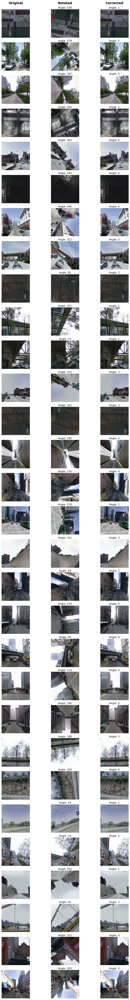

In [ ]:
num_images = 30

display_examples(
    model, 
    test_filenames,
    num_images=num_images,
    size=(224, 224),
    crop_center=True,
    crop_largest_rect=True,
    preprocess_func=preprocess_input,
)

In [ ]:
!curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | sudo bash
!sudo apt-get install git-lfs
!git lfs install
!git clone https://huggingface.co/OmarAlasqa/RotNet_FatimaFellowship

Detected operating system as Ubuntu/bionic.
Checking for curl...
Detected curl...
Checking for gpg...
Detected gpg...
Running apt-get update... done.
Installing apt-transport-https... done.
Installing /etc/apt/sources.list.d/github_git-lfs.list...done.
Importing packagecloud gpg key... done.
Running apt-get update... done.

The repository is setup! You can now install packages.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  git-lfs
0 upgraded, 1 newly installed, 0 to remove and 82 not upgraded.
Need to get 6,800 kB of archives.
After this operation, 15.3 MB of additional disk space will be used.
Get:1 https://packagecloud.io/github/git-lfs/ubuntu bionic/main amd64 git-lfs amd64 3.1.2 [6,800 kB]
Fetched 6,800 kB in 1s (11.1 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [ ]:
!pip install huggingface_hub

     |████████████████████████████████| 67 kB 2.8 MB/s 


In [ ]:
!huggingface-cli login


        _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
        _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
        _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
        _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
        _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

        To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/token.
        (Deprecated, will be removed in v0.3.0) To login with username and password instead, interrupt with Ctrl+C.
        
Token: 
Login successful
Your token has been saved to /root/.huggingface/token


In [ ]:
!git config --global credential.helper store

In [ ]:
from huggingface_hub import HfApi
api = HfApi()

In [ ]:
from huggingface_hub import Repository
repo = Repository(
  local_dir = 'RotNet_FatimaFellowship', 
  clone_from='OmarAlasqa/RotNet_FatimaFellowship',
  skip_lfs_files=True
)

Cloning https://huggingface.co/OmarAlasqa/RotNet_FatimaFellowship into local empty directory.


In [ ]:
repo.push_to_hub(
  commit_message = "Upload the model with logs"
)

Adding files tracked by Git LFS: ['models/rotnet_street_view_resnet50.hdf5']. This may take a bit of time if the files are large.


Upload file models/rotnet_street_view_resnet50.hdf5:   0%|          | 32.0k/684M [00:00<?, ?B/s]

Upload file logs/validation/events.out.tfevents.1648895472.47f07c19801e.76.1.v2: 100%|##########| 7.99k/7.99k …

Upload file logs/train/events.out.tfevents.1648895263.47f07c19801e.76.0.v2:   4%|4         | 32.0k/766k [00:00…

To https://huggingface.co/OmarAlasqa/RotNet_FatimaFellowship
   6fe8685..1343617  main -> main



'https://huggingface.co/OmarAlasqa/RotNet_FatimaFellowship/commit/1343617f194bb3a610f0a5f95982a85d13260af2'

**Write up**: 
* Link to the model on Hugging Face Hub: https://huggingface.co/OmarAlasqa/RotNet_FatimaFellowship
* Some examples of misclassified images:

If there is problem loading the output in the notebook, You can see the prediction of images in this [image](https://drive.google.com/file/d/132ajFEOD8oRG7OtT7Vc2bSwcfpGUcrqs/view?usp=sharing).

![](https://drive.google.com/uc?export=view&id=132ajFEOD8oRG7OtT7Vc2bSwcfpGUcrqs)